# EECS764P Coursework 3
- Name: Bheki Maenetja
- Student ID: 230382466

## Imports

In [1]:
import numpy as np
from scipy.stats import t, norm, probplot
from scipy.integrate import quad

# !pip install plotly
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.io as pio
# pio.renderers.default = "iframe"

## Plotting Functions

In [2]:
# Plotting functions
def plot_data(x=None, y=None, z=None, size=None, colour=None, title="", colour_title="", x_label="", y_label="", name="", mode="markers", text="", fill=None, **traces):
    """
    General purpose function for plotting scatter plots in plotly.
    """
    fig = go.Figure(layout={
        "title": title,
        "xaxis": {"title": x_label},
        "yaxis": {"title": y_label}
    })

    marker = dict()
    
    if size is not None:
        marker["size"] = size
        marker["sizeref"] = 0.01
    if colour is not None:
        marker["color"] = colour
        marker["showscale"] = True
        marker["colorbar"] = dict(title=colour_title)
    
    if z is None:
        data = go.Scatter(
            x=x,
            y=y,
            mode=mode,
            name=name,
            text=text,
            fill=fill,
            marker=marker,
        )
    else:
        data = go.Scatter3d(
            x=x,
            y=y,
            z=z,
            mode=mode,
            name=name,
            text=text,
            marker=marker,
        )

    if x is not None and y is not None:
        fig.add_trace(data)
    
    for t in traces:
        fig.add_trace(traces[t])
    
    return fig

def create_trace(x=None, y=None, z=None, size=None, colour=None, colour_title="", name="", mode="lines", text="", fill=None):
    marker = dict()
    
    if size is not None:
        marker["size"] = size
        marker["sizeref"] = 0.01
    if colour is not None:
        marker["color"] = colour
        marker["showscale"] = True
        marker["colorbar"] = dict(title=colour_title)
    
    if z is None:
        trace = go.Scatter(
            x=x,
            y=y,
            mode=mode,
            name=name,
            text=text,
            fill=fill,
            marker=marker
        )
    else:
        trace = go.Scatter3d(
            x=x,
            y=y,
            z=z,
            mode=mode,
            name=name,
            text=text,
            marker=marker
        )
    
    return trace

def create_histogram(x=None, y=None, histnorm="", name=""):
    return go.Histogram(
        x=x,
        y=None,
        histnorm=histnorm,
        name=name,
    )

def plot_collection(plots, rows=1, cols=1, title="", subplot_titles=[], x_labels={}, height=1000):
    specs = [
        [{"type": "xy"} for c in range(cols)] 
        for r in range(rows)
    ]
    
    fig = make_subplots(
        rows=rows, 
        cols=cols, 
        subplot_titles=subplot_titles,
        specs=specs,
    )
    
    fig.update_layout({
        "title": title,
        "height": height,
    })

    # Add traces
    for k in plots:
        for i in range(len(plots[k].data)):
            fig.add_trace(plots[k].data[i], row=k[0], col=k[1])

    # Update axes
    for k in plots:
        fig.update_xaxes(title_text=x_labels.get(k, ""), row=k[0], col=k[1])

    return fig

## Question 1

In [3]:
# Modified sample mean function from coursework 2
def sample_mean(k, n_samples, sample_size):
    sample_array = t.rvs(df=k, size=[n_samples, sample_size])
    return sample_array.mean(axis=1)

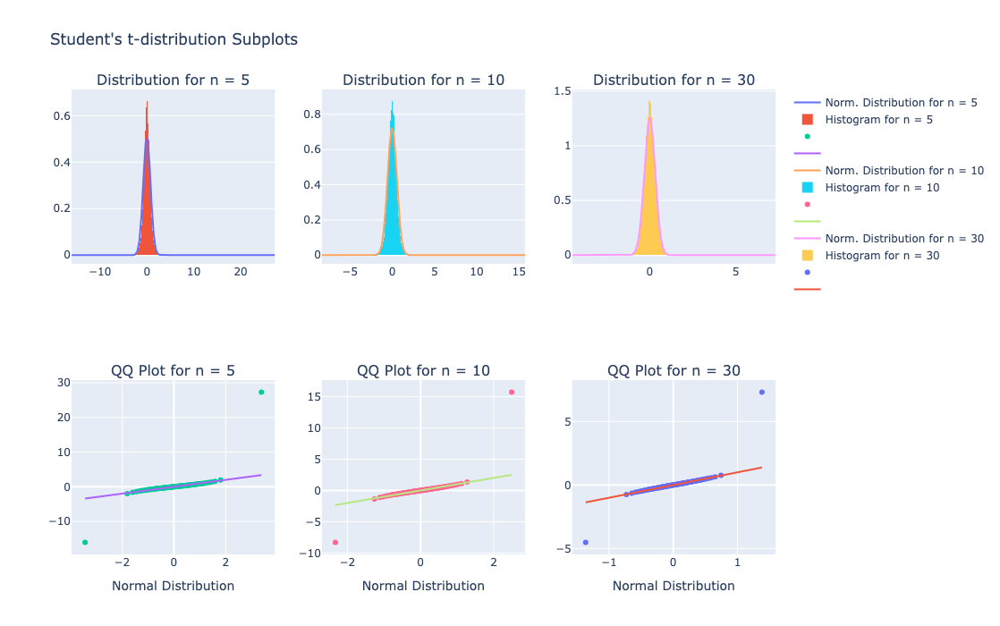

In [4]:
# Initialising k, N and size variables
k = 3
N = [5, 10, 30]
size = 100000

# Initialising subplots parameters
rows = 2
cols = 3

plots = {}
x_labels = {}
subplot_titles = [
    "Distribution for n = 5",
    "Distribution for n = 10",
    "Distribution for n = 30",
    "QQ Plot for n = 5",
    "QQ Plot for n = 10",
    "QQ Plot for n = 30",
]

for i, n in enumerate(N):
    sample_means = sample_mean(k, size, n)

    # Approximate normal distribution
    sigma = np.sqrt(k / ((k-2) * n))
    x = np.linspace(min(sample_means), max(sample_means), 100)
    norm_dist = norm.pdf(x, 0, sigma)
    norm_dist_plot = create_trace(x, norm_dist, name=f"Norm. Distribution for n = {n}", mode="lines")

    # Creating histogram
    hist = create_histogram(sample_means, histnorm="probability density", name=f"Histogram for n = {n}")
    plots[(1,i+1)] = plot_data(t1=norm_dist_plot, t2=hist)

    # Adding QQ plots
    x_norm = norm.rvs(0, sigma, size=size)

    p = np.linspace(0,100,100)
    y_norm = np.percentile(x_norm, p)
    y_sample = np.percentile(sample_means, p)

    curve_trace = create_trace(y_norm, y_sample, mode="markers")
    straight_trace = create_trace(y_norm, y_norm)
    plots[(2,i+1)] = plot_data(t1=curve_trace, t2=straight_trace)
    
    x_labels[(2,i+1)] = "Normal Distribution"

plot_collection(
    plots, 
    rows, 
    cols, 
    "Student's t-distribution Subplots", 
    height=700,
    x_labels=x_labels,
    subplot_titles=subplot_titles,
)

In [5]:
# Wordy bit

## Question 2